# Import Necessary Modules

In [1]:
import os
import sys
import time
import warnings
from functools import reduce

import pandas as pd
import numpy as np
import optuna
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.io as pio
import plotly.offline as py
import lightgbm as lgb
import xgboost as xgb
import matplotlib.pyplot as plt
import shap

from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import (
    accuracy_score, confusion_matrix, f1_score,
    precision_score, recall_score, classification_report,
    roc_curve, auc, balanced_accuracy_score
)
from scipy.stats import randint as sp_randint
from sklearn.metrics import balanced_accuracy_score
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_selection import (
    SelectFromModel, SelectKBest, chi2, RFE, RFECV,
    VarianceThreshold, mutual_info_classif
)
from imblearn.over_sampling import SMOTE
from plotly.subplots import make_subplots

from IPython.core.display import display, HTML

py.init_notebook_mode(connected=True)

warnings.filterwarnings(action='ignore')
pd.set_option('display.max_columns', None)

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display


# Load CSV Files

In [2]:
def get_headers(filepath, start_line=142):
    with open(filepath) as f:
        headers = [line.split(':')[0] for idx, line in enumerate(f.readlines()) if idx >= start_line]
    headers.remove('| instance weight')
    headers.append('target')
    return headers

metadata_file = '/Users/berkekavak/dataiku/us_census_full/census_income_metadata.txt'
train_file = '/Users/berkekavak/dataiku/us_census_full/census_income_learn.csv'
test_file = '/Users/berkekavak/dataiku/us_census_full/census_income_test.csv'

headers = get_headers(metadata_file)

train = pd.read_csv(train_file, header=None, names=headers)
test = pd.read_csv(test_file, header=None, names=headers)
df = train.copy()

# Exploratory Data Analysis (EDA)

In [3]:
train.shape

(199523, 42)

In [4]:
test.shape

(99762, 42)

In [5]:
df.head(5)

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,race,hispanic origin,sex,member of a labor union,reason for unemployment,full or part time employment stat,capital gains,capital losses,dividends from stocks,tax filer stat,region of previous residence,state of previous residence,detailed household and family stat,detailed household summary in household,instance weight,migration code-change in msa,migration code-change in reg,migration code-move within reg,live in this house 1 year ago,migration prev res in sunbelt,num persons worked for employer,family members under 18,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,target
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Not in labor force,0,0,0,Nonfiler,Not in universe,Not in universe,Other Rel 18+ ever marr not in subfamily,Other relative of householder,1700.09,?,?,?,Not in universe under 1 year old,?,0,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,White,All other,Male,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Head of household,South,Arkansas,Householder,Householder,1053.55,MSA to MSA,Same county,Same county,No,Yes,1,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,Asian or Pacific Islander,All other,Female,Not in universe,Not in universe,Not in labor force,0,0,0,Nonfiler,Not in universe,Not in universe,Child 18+ never marr Not in a subfamily,Child 18 or older,991.95,?,?,?,Not in universe under 1 year old,?,0,Not in universe,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Nonfiler,Not in universe,Not in universe,Child <18 never marr not in subfamily,Child under 18 never married,1758.14,Nonmover,Nonmover,Nonmover,Yes,Not in universe,0,Both parents present,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Nonfiler,Not in universe,Not in universe,Child <18 never marr not in subfamily,Child under 18 never married,1069.16,Nonmover,Nonmover,Nonmover,Yes,Not in universe,0,Both parents present,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.


In [6]:
set(df.dtypes)

{dtype('int64'), dtype('float64'), dtype('O')}

In [7]:
display(HTML("<style>.output_scroll { height: 800px; overflow-y: scroll; }</style>"))

def plot_categorical(data, column, output_dir):
    counts = data[column].value_counts()
    percentages = (counts / counts.sum() * 100).round(1)
    
    fig = go.Figure(data=[
        go.Bar(x=counts.index, y=counts.values, text=percentages, textposition='auto')
    ])
    
    fig.update_layout(
        title=f'Distribution of {column}',
        xaxis_title=f'Unique values of {column}',
        yaxis_title='Counts',
        template='plotly_white'
    )
    
    # Save the figure as an image
    fig.write_image(os.path.join(output_dir, f"{column}_categorical.png"))
    
    return fig

def plot_numerical(data, column, output_dir):
    fig = px.histogram(data, x=column, marginal='box')
    
    fig.update_layout(
        title=f'Histogram of {column}',
        xaxis_title=column,
        yaxis_title='Frequency',
        template='plotly_white'
    )
    
    # Save the figure as an image
    fig.write_image(os.path.join(output_dir, f"{column}_numerical.png"))
    
    return fig

# Specify output directory
output_dir = './plots'
os.makedirs(output_dir, exist_ok=True)

column_order = ['target'] + [col for col in df.columns if col != 'target']

# Plot only the first five graphs due to memory limitations
count = 0
max_plots = 5

for col in column_order:
    if count >= max_plots:
        break
    if df[col].dtype == 'object':
        fig = plot_categorical(df, col, output_dir)
        fig.show()
    elif df[col].dtype in ['int64', 'float64']:
        fig = plot_numerical(df, col, output_dir)
        fig.show()
    count += 1

# Data Cleaning and Processing

In [8]:
def drop_duplicated_rows(df):
    return df.drop_duplicates(keep='first')

def strip_data(df):
    for col in df.columns:
        if df[col].dtype not in ['int64', 'float64']:
            df[col] = df[col].str.strip()
    return df

def handle_nan(df):
    df = df.replace('\?', np.nan, regex=True)
    df = df.replace('.*Not in universe.*', np.nan, regex=True)
    df = df.replace('.*Do not know*', np.nan, regex=True)
    return df

def handle_target(df):
    df['target'].replace('- 50000.', 0, inplace=True)
    df['target'].replace('50000+.', 1, inplace=True)
    return df


def modify_feature_names(df):
    invalid_chars = {
        '[': '',
        ']': '',
        '<': 'lt',
        '>': 'gt',
        '(': '',
        ')': '',
        ' ': '_'
    }
    
    new_columns = []
    for col in df.columns:
        col = col.lower()
        for old_char, new_char in invalid_chars.items():
            col = col.replace(old_char, new_char)
        new_columns.append(col)
    
    df.columns = new_columns
    return df

In [9]:
# Drop columns if 90% or more are NA

to_be_dropped = []

for idx, col in enumerate(train.columns):
    na_perc = round((100 * pd.isna(train[col]).sum()/len(train[col])),2)
    if pd.isna(train[col]).any():
        if (na_perc > 90):
            to_be_dropped.append(col)
            print(f'{idx},{col} has {na_perc}% NA values')
            
to_be_dropped.append('instance weight')

train = drop_duplicated_rows(train)

df = strip_data(df)
train = strip_data(train)
test = strip_data(test)

train = train.drop(columns = to_be_dropped)
test = test.drop(columns = to_be_dropped)

train = handle_nan(train)
test = handle_nan(test)

train = handle_target(train)
test = handle_target(test)

In [10]:
train.describe(include='all')

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,race,hispanic origin,sex,member of a labor union,reason for unemployment,full or part time employment stat,capital gains,capital losses,dividends from stocks,tax filer stat,region of previous residence,state of previous residence,detailed household and family stat,detailed household summary in household,migration code-change in msa,migration code-change in reg,migration code-move within reg,live in this house 1 year ago,migration prev res in sunbelt,num persons worked for employer,family members under 18,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,target
count,196294.000000,99265,196294.000000,196294.000000,196294,196294.000000,12532,196294,98827,98827,196294,195989,196294,19062,6068,196294,196294.000000,196294.000000,196294.000000,196294,15732,15025,196294,196294,96860,96860,96860,96860,15732,196294.000000,52133,189591,190187,192905,196294,196294.000000,1984,196294.000000,196294.000000,196294.000000,196294.000000
unique,NaN,8,NaN,NaN,17,NaN,2,7,23,14,5,9,2,2,5,8,NaN,NaN,NaN,6,5,49,38,8,8,7,8,2,2,NaN,4,42,42,42,5,NaN,2,NaN,NaN,NaN,NaN
top,NaN,Private,NaN,NaN,High school graduate,NaN,High school,Married-civilian spouse present,Retail trade,Adm support including clerical,White,All other,Female,No,Other job loser,Children or Armed Forces,NaN,NaN,NaN,Nonfiler,South,California,Householder,Householder,Nonmover,Nonmover,Nonmover,Yes,No,NaN,Both parents present,United-States,United-States,United-States,Native- Born in the United States,NaN,No,NaN,NaN,NaN,NaN
freq,NaN,72021,NaN,NaN,48374,NaN,6853,84194,17069,14836,164380,168803,102400,16032,2038,120632,NaN,NaN,NaN,71903,4875,1710,53242,75461,81128,81128,81128,81128,9959,NaN,36107,156037,157355,173783,173786,NaN,1593,NaN,NaN,NaN,NaN
mean,34.929468,NaN,15.603187,11.490468,NaN,56.336505,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,441.870037,37.927593,200.722386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.988105,NaN,NaN,NaN,NaN,NaN,0.178304,NaN,1.538183,23.553889,94.499328,0.063079
std,22.210001,NaN,18.106401,14.498128,NaN,277.054333,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4735.677027,274.081174,2000.130616,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.371018,NaN,NaN,NaN,NaN,NaN,0.557739,NaN,0.836813,24.428588,0.500001,0.243105
min,0.000000,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,94.000000,0.000000
25%,16.000000,NaN,0.000000,0.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,2.000000,0.000000,94.000000,0.000000
50%,34.000000,NaN,1.000000,2.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,2.000000,12.000000,94.000000,0.000000
75%,50.000000,NaN,33.000000,26.000000,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,2.000000,52.000000,95.000000,0.000000


In [11]:
# Here I create a validation set to observe the performance of the models. 

In [12]:
X_train, X_val, y_train, y_val = train_test_split(train.drop(columns='target'), train['target'], 
                                                    stratify=train['target'], 
                                                    test_size=0.2, random_state=42)

In [13]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((157035, 40), (39259, 40), (157035,), (39259,))

# Imputing, Encoding, Scaling and Feature Engineering

In [14]:
def preprocess_data(df, fit=True, strategy='mean', scaling_method='standard', log_transform_cols=None):

    if fit:
        preprocess_data.imputers = {}
        preprocess_data.scalers = {}
        preprocess_data.encoders = {}
        preprocess_data.dummy_columns = {}

    processed_df = pd.DataFrame(index=df.index)

    for col in df.columns:
        
        # Imputes missing values.
        # No need for numerical variables since there were no empty values in the train set. 
        # Added if test data would have empty values.
        # For categorical variables, most frequent values are imputed.
        
        if col not in preprocess_data.imputers:
            
            if df[col].dtype in ['int64', 'float64']:     
                imputer = SimpleImputer(strategy=strategy)
            else:
                imputer = SimpleImputer(strategy='most_frequent')
                
            preprocess_data.imputers[col] = imputer

        imputer = preprocess_data.imputers[col]
        imputed_data = imputer.fit_transform(df[[col]]) if fit else imputer.transform(df[[col]])
        
        # Added ravel since the Simple Imputer returns a 2D array and needs to be flattened.
        
        df[col] = imputed_data.ravel() if imputed_data.ndim > 1 else imputed_data

        # Feature engineering: Log transformation for the skewed features to make them more normally distributed
        
        if log_transform_cols and col in log_transform_cols:
            df[col] = np.log1p(df[col])

        # Scaling for the numerical features. 
        
        if df[col].dtype in ['int64', 'float64']:
            if col not in preprocess_data.scalers:
                scaler = StandardScaler()
                preprocess_data.scalers[col] = scaler

            scaler = preprocess_data.scalers[col]
            scaled_data = scaler.fit_transform(df[[col]]) if fit else scaler.transform(df[[col]])
            processed_df[col + '_scaled'] = scaled_data

        # Encoding for the categorical features.
        
        elif df[col].dtype == 'object':
            if fit:
                encoder = pd.get_dummies(df[col], prefix=col, prefix_sep='__')
                preprocess_data.dummy_columns[col] = encoder.columns.tolist()
            else:
                encoder = pd.get_dummies(df[col], prefix=col, prefix_sep='__')
                for column in preprocess_data.dummy_columns[col]:
                    if column not in encoder.columns:
                        encoder[column] = 0
            processed_df = pd.concat([processed_df, encoder[preprocess_data.dummy_columns[col]]], axis=1)

    return processed_df


log_transform_columns = ['wage per hour', 'capital gains', 'capital losses', 'dividends from stocks']

X_train_preprocessed = preprocess_data(X_train, fit=True, strategy='mean', scaling_method='standard', log_transform_cols=log_transform_columns)
X_val_preprocessed = preprocess_data(X_val, fit=False, strategy='mean', scaling_method='standard', log_transform_cols=log_transform_columns)
X_test_preprocessed = preprocess_data(test.drop(columns='target'), fit=False, strategy='mean', scaling_method='standard', log_transform_cols=log_transform_columns)
y_train_preprocessed = y_train
y_val_preprocessed = y_val
y_test_preprocessed = test['target']

In [15]:
X_train_preprocessed.shape, X_val_preprocessed.shape, X_test_preprocessed.shape,  y_train_preprocessed.shape, y_val_preprocessed.shape, y_test_preprocessed.shape

((157035, 384), (39259, 384), (99762, 384), (157035,), (39259,), (99762,))

In [16]:
start_time = time.time()

X = X_val_preprocessed
y = y_val_preprocessed

mi_scores = mutual_info_classif(X, y, random_state=42)
mi_scores_series = pd.Series(mi_scores, index=X.columns, name="MI Scores").sort_values(ascending=False)

top_10_mi_scores = mi_scores_series.head(10).iloc[::-1]

fig = px.bar(
    top_10_mi_scores, 
    orientation='h', 
    labels={'index': 'Features', 'value': 'Mutual Information'},
    color=top_10_mi_scores.values, 
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Top 10 Mutual Information Scores with Target"
)

fig.update_layout(
    xaxis_title="Mutual Information Score",
    yaxis_title="Features",
    coloraxis_showscale=True,
    height=400
)

end_time = time.time()

print(f'{(end_time - start_time)/60}')

fig.show()

0.6125120282173157


In [17]:
start_time = time.time()

X = X_train_preprocessed
y = y_train_preprocessed

mi_scores = mutual_info_classif(X, y, random_state=42)
mi_scores_series = pd.Series(mi_scores, index=X.columns, name="MI Scores").sort_values(ascending=False)

top_10_mi_scores = mi_scores_series.head(10).iloc[::-1]

fig = px.bar(
    top_10_mi_scores, 
    orientation='h', 
    labels={'index': 'Features', 'value': 'Mutual Information'},
    color=top_10_mi_scores.values, 
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Top 10 Mutual Information Scores with Target"
)

fig.update_layout(
    xaxis_title="Mutual Information Score",
    yaxis_title="Features",
    coloraxis_showscale=True,
    height=400
)

end_time = time.time()

print(f'{(end_time - start_time)/60}')

fig.show()

2.703055667877197


In [18]:
# Cleaned the column names for the algorithms.

X_train_preprocessed = modify_feature_names(X_train_preprocessed)
X_val_preprocessed = modify_feature_names(X_val_preprocessed)
X_test_preprocessed = modify_feature_names(X_test_preprocessed)

In [19]:
print((X_train_preprocessed.columns == X_test_preprocessed.columns).all(), 
      (X_train_preprocessed.columns == X_val_preprocessed.columns).all())

True True


In [20]:
model1 = xgb.XGBClassifier(random_state=42)
model1.fit(X_train_preprocessed, y_train_preprocessed)
y_pred_1 = model1.predict(X_val_preprocessed)
f1_score(y_pred_1 , y_val_preprocessed)

0.5873093949827841

In [21]:
print(classification_report(y_val_preprocessed, y_pred_1))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     36783
           1       0.75      0.48      0.59      2476

    accuracy                           0.96     39259
   macro avg       0.86      0.74      0.78     39259
weighted avg       0.95      0.96      0.95     39259



In [22]:
balanced_accuracy_score(y_val_preprocessed, y_pred_1)

0.7357317796725739

# Feature Selection

In [23]:
# Some feature selection methods were too time consuming, so I decided to proceed with only three selectors

def select_features(X_train, y_train, X_test):
    start_time = time.time()
    
    selectors = {
#        'SelectFromModel1': LogisticRegression(penalty='l1', solver='liblinear'),
        'SelectFromModel2': SelectFromModel(ExtraTreesClassifier(n_estimators=100, random_state=42)),
        'SelectKBest50_MI': SelectKBest(score_func=mutual_info_classif, k=50),
#        'RFE': RFECV(RandomForestClassifier(), step=5, cv=3, scoring='f1'),
        'SelectFromModel3': SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=42))
#        'VT80': VarianceThreshold(threshold=(0.8 * (1 - 0.8)))
    }
    
    reduced_datasets = {}
    
    for name, selector in selectors.items():

        X_train_reduced = selector.fit_transform(X_train, y_train)
        X_test_reduced = selector.transform(X_test)
        support_mask = selector.get_support()
        selected_columns = X_train.columns[support_mask]

        X_train_reduced_df = pd.DataFrame(X_train_reduced, columns=selected_columns, index=X_train.index)
        X_test_reduced_df = pd.DataFrame(X_test_reduced, columns=selected_columns, index=X_test.index)
        
        reduced_datasets[name] = (X_train_reduced_df, X_test_reduced_df)
        print(name, selector)
    
    end_time = time.time()
    duration_minutes = (end_time - start_time) / 60
    print(f'This code took {duration_minutes:.2f} minutes to execute.')
    
    return reduced_datasets

In [24]:
feature_selected_data = select_features(X_train_preprocessed, y_train_preprocessed, X_val_preprocessed)

SelectFromModel2 SelectFromModel(estimator=ExtraTreesClassifier(random_state=42))
SelectKBest50_MI SelectKBest(k=50, score_func=<function mutual_info_classif at 0x30d1e1300>)
SelectFromModel3 SelectFromModel(estimator=RandomForestClassifier(random_state=42))
This code took 3.59 minutes to execute.


In [25]:
selector_perf = []

for sel in feature_selected_data:
    selector = feature_selected_data[sel]
    X_train_selected, X_val_selected = selector

    train_data = lgb.Dataset(X_train_selected, label=y_train, categorical_feature='auto')
    test_data = lgb.Dataset(X_val_selected, label=y_val, reference=train_data)

    params = {
        'objective': 'binary',
        'metric': 'binary_error',
        'boosting_type': 'gbdt',
        'learning_rate': 0.1,
        'num_leaves': 31,
        'max_depth': -1,
        'n_estimators': 100
    }

    gbm = lgb.train(params, train_data, valid_sets=[test_data], early_stopping_rounds=10)

    y_pred = gbm.predict(X_val_selected, num_iteration=gbm.best_iteration)
    y_pred_binary = (y_pred >= 0.5).astype(int)

    bal_accuracy = balanced_accuracy_score(y_val, y_pred_binary)
    f1score = f1_score(y_val, y_pred_binary)
    
    selector_perf.append(f'Sel: {sel}, EqWAccuracy: {bal_accuracy}, F1 Score: {f1score}')
    print(f'Selector: {sel} EqWAccuracy: {bal_accuracy}, F1 Score: {f1score}')  

[LightGBM] [Info] Number of positive: 9906, number of negative: 147129
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1117
[LightGBM] [Info] Number of data points in the train set: 157035, number of used features: 74
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.063081 -> initscore=-2.698169
[LightGBM] [Info] Start training from score -2.698169
[1]	valid_0's binary_error: 0.0630683
Training until validation scores don't improve for 10 rounds
[2]	valid_0's binary_error: 0.0630683
[3]	valid_0's binary_error: 0.0630683
[4]	valid_0's binary_error: 0.0630683
[5]	valid_0's binary_error: 0.0629919
[6]	valid_0's binary_error: 0.0586617
[7]	valid_0's binary_error: 0.0578721
[8]	valid_0's binary_error: 0.0564966
[9]	valid_0's binary_error: 0.0540004
[10]	valid_0's binary_error: 0.0526

[18]	valid_0's binary_error: 0.0473777
[19]	valid_0's binary_error: 0.0470465
[20]	valid_0's binary_error: 0.0465371
[21]	valid_0's binary_error: 0.0463588
[22]	valid_0's binary_error: 0.0461805
[23]	valid_0's binary_error: 0.0459512
[24]	valid_0's binary_error: 0.0459767
[25]	valid_0's binary_error: 0.0459003
[26]	valid_0's binary_error: 0.0459767
[27]	valid_0's binary_error: 0.0458239
[28]	valid_0's binary_error: 0.045722
[29]	valid_0's binary_error: 0.0456201
[30]	valid_0's binary_error: 0.0454418
[31]	valid_0's binary_error: 0.0455182
[32]	valid_0's binary_error: 0.0451107
[33]	valid_0's binary_error: 0.0451107
[34]	valid_0's binary_error: 0.0451871
[35]	valid_0's binary_error: 0.0449833
[36]	valid_0's binary_error: 0.0449324
[37]	valid_0's binary_error: 0.044856
[38]	valid_0's binary_error: 0.044856
[39]	valid_0's binary_error: 0.0446012
[40]	valid_0's binary_error: 0.0446267
[41]	valid_0's binary_error: 0.0445248
[42]	valid_0's binary_error: 0.0443465
[43]	valid_0's binary_error:

In [26]:
selector_perf

['Sel: SelectFromModel2, EqWAccuracy: 0.733120170969969, F1 Score: 0.5829220138203356',
 'Sel: SelectKBest50_MI, EqWAccuracy: 0.7246038494024049, F1 Score: 0.5730138713745272',
 'Sel: SelectFromModel3, EqWAccuracy: 0.7290697654501401, F1 Score: 0.5775454319143639']

In [27]:
selector = SelectFromModel(ExtraTreesClassifier(n_estimators=100, random_state=42))

X_train_reduced = selector.fit_transform(X_train_preprocessed, y_train_preprocessed)
X_val_reduced = selector.transform(X_val_preprocessed)
X_test_reduced = selector.transform(X_test_preprocessed)

support_mask = selector.get_support()
selected_columns = X_train_preprocessed.columns[support_mask]

X_train_reduced_df = pd.DataFrame(X_train_reduced, columns=selected_columns, index=X_train_preprocessed.index)
X_val_reduced_df = pd.DataFrame(X_val_reduced, columns=selected_columns, index=X_val_preprocessed.index)
X_test_reduced_df = pd.DataFrame(X_test_reduced, columns=selected_columns, index=X_test_preprocessed.index)

In [28]:
print((X_train_reduced_df.columns == X_test_reduced_df.columns).all(), 
      (X_test_reduced_df.columns == X_val_reduced_df.columns).all())

True True


In [29]:
X_train_reduced_df.shape, len(y_train_preprocessed), X_val_reduced_df.shape , len(y_val_preprocessed)

((157035, 74), 157035, (39259, 74), 39259)

In [30]:
model2 = xgb.XGBClassifier(random_state=42)
model2.fit(X_train_reduced_df, y_train_preprocessed)
y_pred_2 = model2.predict(X_val_reduced_df)
f1_score(y_pred_2 , y_val_preprocessed)

0.5979581915410793

In [31]:
print(balanced_accuracy_score(y_val_preprocessed, y_pred_2))

0.7428384508243496


In [32]:
print(classification_report(y_val_preprocessed, y_pred_2))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     36783
           1       0.75      0.50      0.60      2476

    accuracy                           0.96     39259
   macro avg       0.86      0.74      0.79     39259
weighted avg       0.95      0.96      0.95     39259



# Balancing the classes with SMOTE

In [33]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the reduced feature set
X_train_smote, y_train_smote = smote.fit_resample(X_train_reduced_df, y_train_preprocessed)

In [34]:
model3 = xgb.XGBClassifier(random_state=42)
model3.fit(X_train_smote, y_train_smote)
y_pred_3 = model3.predict(X_val_reduced_df)
f1_score(y_pred_3 , y_val_preprocessed)

0.5937698664971393

In [35]:
print(classification_report(y_val_preprocessed, y_pred_3))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97     36783
           1       0.62      0.57      0.59      2476

    accuracy                           0.95     39259
   macro avg       0.80      0.77      0.78     39259
weighted avg       0.95      0.95      0.95     39259



In [36]:
X_train_smote.shape, y_train_smote.shape

((294258, 74), (294258,))

In [37]:
models = {
    'LightGBM': LGBMClassifier(random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Logistic Regression': LogisticRegression()
}

In [38]:
def evaluate_models(X_train, y_train, X_val, y_val, models):
    results = {}
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_val_pred = model.predict(X_val)
        f1 = f1_score(y_val, y_val_pred, average='binary')
        eqwacc = balanced_accuracy_score(y_val, y_val_pred)
        results[name] = f1
        print(f"{name} model F1 score: {f1:.4f}, EqWAcc: {eqwacc}")
    return results

model_results = evaluate_models(X_train_smote, y_train_smote, X_val_reduced_df, y_val_preprocessed, models)

LightGBM model F1 score: 0.5938, EqWAcc: 0.7792780021869519
XGBoost model F1 score: 0.5938, EqWAcc: 0.7714704888211116
Random Forest model F1 score: 0.5397, EqWAcc: 0.7358089141499087
Decision Tree model F1 score: 0.4458, EqWAcc: 0.7188003611277018
Logistic Regression model F1 score: 0.4281, EqWAcc: 0.8662768811732012


In [39]:
# Tried Lazypredict to observe the performance of the models but take a lot of time.

In [40]:
# X_train_sampled = X_train_smote.sample(n=50000, random_state=42)
# y_train_sampled = y_train_smote.loc[X_train_sampled.index]

# from lazypredict.Supervised import LazyClassifier

# clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
# models,predictions = clf.fit(X_train_sampled, X_val_reduced_df, y_train_sampled, y_val_preprocessed)

# print(models)

# Adjustments for the naming convention

In [41]:
X_train_final, y_train_final, X_val_final, y_val_final = X_train_smote, y_train_smote, X_val_reduced_df, y_val_preprocessed

In [42]:
X_test_final = X_test_reduced_df
y_test_final = y_test_preprocessed

# Hyperparameter Optimization

In [43]:
# XGBoost Hyperparameter Optimization

start_time = time.time()

model4 = xgb.XGBClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.6, 0.8, 1]
}

grid = GridSearchCV(estimator=model4, param_grid=param_grid, scoring='f1', cv=3, verbose=1, n_jobs=-1)

grid_result = grid.fit(X_train_final, y_train_final)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
for params, mean_score, scores in zip(
        grid_result.cv_results_['params'], 
        grid_result.cv_results_['mean_test_score'], 
        grid_result.cv_results_['std_test_score']):
    print("%f (%f) with: %r" % (mean_score, scores, params))
    
end_time = time.time()

print(f'{(end_time - start_time)/60}')

Fitting 3 folds for each of 162 candidates, totalling 486 fits
Best: 0.963474 using {'colsample_bytree': 1, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'subsample': 0.8}
0.877190 (0.002350) with: {'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.8}
0.876888 (0.002315) with: {'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1}
0.887876 (0.002657) with: {'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}
0.887995 (0.002985) with: {'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1}
0.897251 (0.003070) with: {'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300, 'subsample': 0.8}
0.897192 (0.003375) with: {'colsample_bytree': 0.6, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300, 'subsample': 1}
0.910513 (0.004573) with: {'colsample_b

In [44]:
# # LGBM Hyperparameter Optimization

# model5 = lgb.LGBMClassifier(boosting_type='gbdt', objective='binary', random_state=42)

# # Define the parameter grid
# param_grid2 = {
#     'num_leaves': [31, 50, 100],
#     'max_depth': [10, 20, 40],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'n_estimators': [100, 200, 500]
# }

# grid2 = GridSearchCV(estimator=model5, param_grid=param_grid2, scoring='f1', cv=3, verbose=1, n_jobs=-1)

# grid_result2 = grid2.fit(X_train_final, y_train_final)

# print("Best: %f using %s" % (grid_result2.best_score_, grid_result2.best_params_))
# for params, mean_score, scores in zip(
#         grid_result2.cv_results_['params'],
#         grid_result2.cv_results_['mean_test_score'],
#         grid_result2.cv_results_['std_test_score']):
#     print("%f (%f) with: %r" % (mean_score, scores, params))

In [45]:
# XGBoost with best hypo parameters
best_params = grid_result.best_params_
print("Best parameters found: ", best_params)

best_model = xgb.XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    max_depth=best_params['max_depth'],
    learning_rate=best_params['learning_rate'],
    n_estimators=best_params['n_estimators'],
    subsample=best_params.get('subsample', 1),
    colsample_bytree=best_params.get('colsample_bytree', 1)
)

best_model.fit(X_train_final, y_train_final)

y_val_pred_xgbbest = best_model.predict(X_val_final)

f1_score(y_val_final, y_val_pred_xgbbest)

Best parameters found:  {'colsample_bytree': 1, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'subsample': 0.8}


0.6047588966098126

In [46]:
# #
# best_params2 = grid_result2.best_params_
# print("Best parameters found: ", best_params2)

# # Create a new model with the best parameters
# best_model2 = lgb.LGBMClassifier(
#     boosting_type='gbdt',
#     objective='binary',
#     random_state=42,
#     num_leaves=best_params2['num_leaves'],
#     max_depth=best_params2['max_depth'],
#     learning_rate=best_params2['learning_rate'],
#     n_estimators=best_params2['n_estimators']
# )

# best_model2.fit(X_train_final, y_train_final)

# y_val_pred_lgbmbest = best_model2.predict(X_val_final)

# f1_score(y_val_final, y_val_pred_lgbmbest)

# Results

In [47]:
 # Plots confusion matrices with their percentages

def plot_confusion_matrices(model, X_train, y_train, X_val, y_val, desc='Test Confusion Matrix'):
    # Predictions
    prediction_train = model.predict(X_train)
    prediction_val = model.predict(X_val)
    
    train_confusion_matrix_counts = confusion_matrix(y_train, prediction_train)
    train_confusion_matrix_percentages = confusion_matrix(y_train, prediction_train, normalize='true')
    
    val_confusion_matrix_counts = confusion_matrix(y_val, prediction_val)
    val_confusion_matrix_percentages = confusion_matrix(y_val, prediction_val, normalize='true')
    
    train_labels = [["{:.1%}\n({})".format(percentage, count) 
                     for percentage, count in zip(row_percentage, row_count)]
                    for row_percentage, row_count in zip(train_confusion_matrix_percentages, train_confusion_matrix_counts)]
    
    val_labels = [["{:.1%}\n({})".format(percentage, count) 
                   for percentage, count in zip(row_percentage, row_count)]
                  for row_percentage, row_count in zip(val_confusion_matrix_percentages, val_confusion_matrix_counts)]
    
    fig = make_subplots(rows=1, cols=2, subplot_titles=("Train Confusion Matrix", desc))
    
    fig.add_trace(go.Heatmap(
        z=train_confusion_matrix_percentages,
        x=['0', '1'],
        y=['0', '1'],
        text=train_labels,
        texttemplate="%{text}",
        colorscale='Blues',
        showscale=True), row=1, col=1)
    
    fig.add_trace(go.Heatmap(
        z=val_confusion_matrix_percentages,
        x=['0', '1'],
        y=['0', '1'],
        text=val_labels,
        texttemplate="%{text}",
        colorscale='Blues',
        showscale=True), row=1, col=2)
    

    fig.update_yaxes(autorange="reversed")
    fig.update_layout(
        title_text= f"Confusion Matrices",
        title_x=0.5,
        height=600,
        width=1200,
        template='plotly_white'
    )
    
    fig.show()


# Model 1 - XGBoost

In [48]:
y_test_pred_xgbbest = best_model.predict(X_test_final)
# y_test_pred_lgbmbest = best_model2.predict(X_test_final)

In [49]:
f1_score(y_test_final, y_test_pred_xgbbest)

0.6035919910629887

In [50]:
balanced_accuracy_score(y_test_final, y_test_pred_xgbbest)

0.7735062334535445

In [51]:
print(classification_report(y_test_final, y_test_pred_xgbbest))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     93576
           1       0.64      0.57      0.60      6186

    accuracy                           0.95     99762
   macro avg       0.81      0.77      0.79     99762
weighted avg       0.95      0.95      0.95     99762



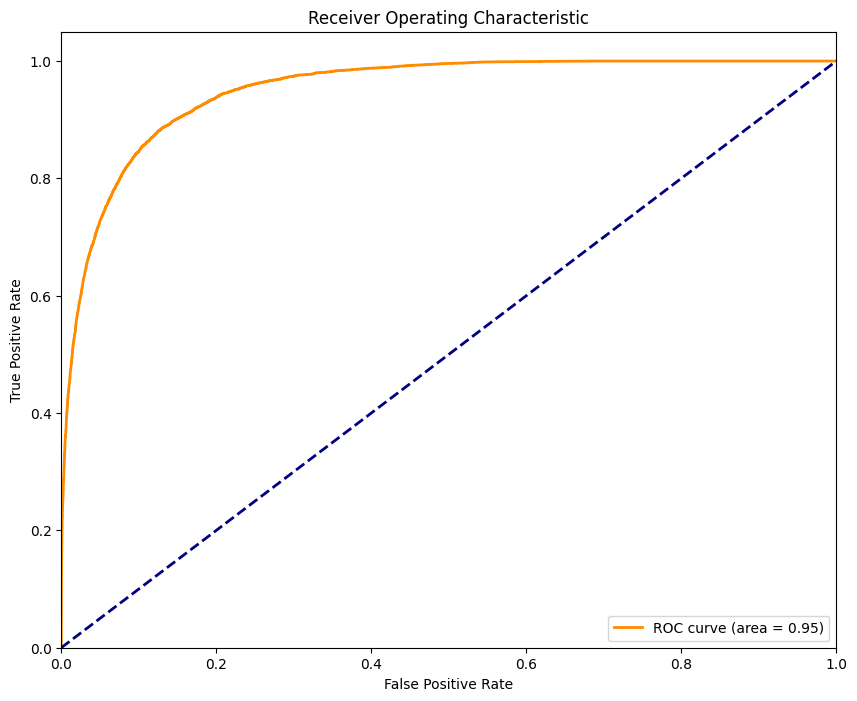

AUC: 0.95
Gini Coefficient: 0.90


In [52]:
y_probs = best_model.predict_proba(X_test_reduced_df)[:, 1] 

fpr, tpr, thresholds = roc_curve(y_test_preprocessed, y_probs)
roc_auc = auc(fpr, tpr)

gini_coefficient = 2 * roc_auc - 1

plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f"AUC: {roc_auc:.2f}")
print(f"Gini Coefficient: {gini_coefficient:.2f}")

In [53]:
#Plots the confusion matrices for the first best model (Train and Validation Sets)

plot_confusion_matrices(best_model, X_train_final, y_train_final, X_val_final, y_val_final, desc='Validation Confusion Matrix')

In [54]:
#Plots the confusion matrices for the first best model (Train and Test Sets)

plot_confusion_matrices(best_model, X_train_final, y_train_final, X_test_final, y_test_final, desc='Test Confusion Matrix')

In [55]:
# Top 10 Model Importances

feature_importances = best_model.get_booster().get_score(importance_type='weight')
importance_df = pd.DataFrame(feature_importances.items(), columns=['Feature', 'Importance'])

top_features = importance_df.sort_values(by='Importance', ascending=False).head(10)

fig = px.bar(top_features, x='Importance', y='Feature', title='Top 10 Feature Importances',
             labels={'Importance': 'Importance', 'Feature': 'Feature'}, orientation='h')

fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

# Added Regularization to Solve Overfitting for the XGBoost Model

# Model 2 - XGBoost

In [56]:
# XGBoost Hypo with Regularization

model6 = xgb.XGBClassifier(random_state=42)

param_grid3 = {
    'max_depth': [10, 12],
    'learning_rate': [0.05],
    'n_estimators': [300],
    'subsample': [0.9],
    'colsample_bytree': [1],
    'gamma': [750, 1000],
    'reg_alpha': [750, 1000], 
    'reg_lambda': [750, 1000] 
}

grid3 = GridSearchCV(estimator=model6, param_grid=param_grid3, scoring='f1', cv=3, verbose=1, n_jobs=-1)

grid_result3 = grid3.fit(X_train_final, y_train_final)

print("Best: %f using %s" % (grid_result3.best_score_, grid_result3.best_params_))
for params, mean_score, scores in zip(
        grid_result3.cv_results_['params'], 
        grid_result3.cv_results_['mean_test_score'], 
        grid_result3.cv_results_['std_test_score']):
    print("%f (%f) with: %r" % (mean_score, scores, params))

Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best: 0.888141 using {'colsample_bytree': 1, 'gamma': 750, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'reg_alpha': 750, 'reg_lambda': 1000, 'subsample': 0.9}
0.888053 (0.003322) with: {'colsample_bytree': 1, 'gamma': 750, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'reg_alpha': 750, 'reg_lambda': 750, 'subsample': 0.9}
0.888141 (0.003200) with: {'colsample_bytree': 1, 'gamma': 750, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'reg_alpha': 750, 'reg_lambda': 1000, 'subsample': 0.9}
0.886820 (0.003498) with: {'colsample_bytree': 1, 'gamma': 750, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'reg_alpha': 1000, 'reg_lambda': 750, 'subsample': 0.9}
0.886495 (0.003336) with: {'colsample_bytree': 1, 'gamma': 750, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'reg_alpha': 1000, 'reg_lambda': 1000, 'subsample': 0.9}
0.888053 (0.003322) with: {'colsample_b

In [57]:
best_params3 = grid_result3.best_params_
print("Best parameters found: ", best_params3)

Best parameters found:  {'colsample_bytree': 1, 'gamma': 750, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'reg_alpha': 750, 'reg_lambda': 1000, 'subsample': 0.9}


In [58]:
#Regularized Best Hypo Model

best_model3 = xgb.XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    max_depth=best_params3['max_depth'],
    learning_rate=best_params3['learning_rate'],
    n_estimators=best_params3['n_estimators'],
    subsample=best_params3.get('subsample', 1),
    colsample_bytree=best_params3.get('colsample_bytree', 1),
    gamma=best_params3.get('gamma', 0),
    reg_alpha=best_params3.get('reg_alpha', 0),
    reg_lambda=best_params3.get('reg_lambda', 1)
)

best_model3.fit(X_train_final, y_train_final)

y_val_pred_xgbbest2 = best_model3.predict(X_val_final)
y_test_pred_xgbbest2 = best_model3.predict(X_test_final)

f1 = f1_score(y_val_final, y_val_pred_xgbbest2)
print("F1 Score on Validation Data: ", f1)

f1 = f1_score(y_test_final, y_test_pred_xgbbest2)
print("F1 Score on Test Data: ", f1)

F1 Score on Validation Data:  0.42282564311964066
F1 Score on Test Data:  0.4313628493692803


In [59]:
# Regularized XGBoost Model Confusion Matrices for train and validation data

plot_confusion_matrices(best_model3, X_train_final, y_train_final, X_val_final, y_val_final, desc='Validation Confusion Matrix')

In [60]:
#Best XGBoost Model Train and Test Performance

plot_confusion_matrices(best_model3, X_train_final, y_train_final, X_test_final, y_test_final, desc='Test Confusion Matrix')

In [61]:
print(classification_report(y_test_final, y_test_pred_xgbbest2))

              precision    recall  f1-score   support

           0       0.99      0.86      0.92     93576
           1       0.29      0.85      0.43      6186

    accuracy                           0.86     99762
   macro avg       0.64      0.85      0.68     99762
weighted avg       0.94      0.86      0.89     99762



In [62]:
balanced_accuracy_score(y_test_final, y_test_pred_xgbbest2)

0.8542830624580056

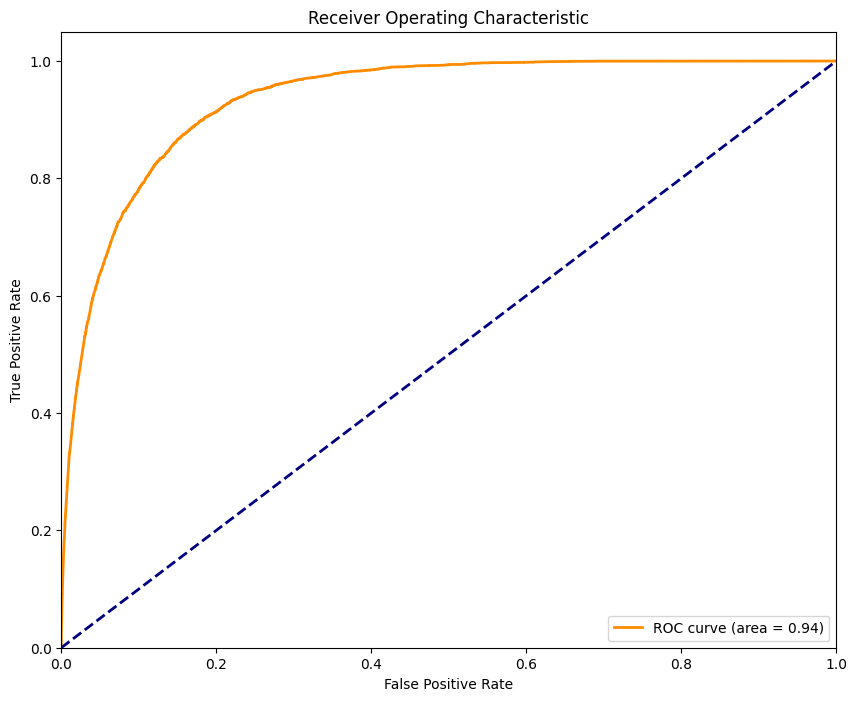

AUC: 0.94
Gini Coefficient: 0.87


In [63]:
y_probs = best_model3.predict_proba(X_test_final)[:, 1] 

fpr, tpr, thresholds = roc_curve(y_test_preprocessed, y_probs)
roc_auc = auc(fpr, tpr)

gini_coefficient = 2 * roc_auc - 1

plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

print(f"AUC: {roc_auc:.2f}")
print(f"Gini Coefficient: {gini_coefficient:.2f}")

In [64]:
feature_importances2 = best_model3.get_booster().get_score(importance_type='weight')
importance_df = pd.DataFrame(feature_importances2.items(), columns=['Feature', 'Importance'])

top_features = importance_df.sort_values(by='Importance', ascending=False).head(10)

fig = px.bar(top_features, x='Importance', y='Feature', title='Top 10 Feature Importances',
             labels={'Importance': 'Importance', 'Feature': 'Feature'}, orientation='h')

fig.update_layout(yaxis=dict(autorange="reversed"))
fig.show()

# Model 3 - Logistic Regression

In [65]:
lr = LogisticRegression()
lr.fit(X_train_final,y_train_final)
lr_test_pred = lr.predict(X_test_final)

In [66]:
print(classification_report(y_test_final, lr_test_pred))

              precision    recall  f1-score   support

           0       0.99      0.86      0.92     93576
           1       0.29      0.88      0.43      6186

    accuracy                           0.86     99762
   macro avg       0.64      0.87      0.68     99762
weighted avg       0.95      0.86      0.89     99762



In [67]:
lr_train_pred = lr.predict(X_train_final)

In [68]:
#Logistic Regression Train and Validation Performance

plot_confusion_matrices(lr, X_train_final, y_train_final, X_val_final, y_val_final, desc='Validation Confusion Matrix')

In [69]:
#Logistic Regression Train and Validation Performance

plot_confusion_matrices(lr, X_train_final, y_train_final, X_test_final, y_test_final, desc='Test Confusion Matrix')

In [70]:
# Validation Classification Report

print(classification_report(y_val_final, lr.predict(X_val_final)))

              precision    recall  f1-score   support

           0       0.99      0.85      0.91     36783
           1       0.28      0.88      0.43      2476

    accuracy                           0.85     39259
   macro avg       0.64      0.87      0.67     39259
weighted avg       0.95      0.85      0.88     39259



In [71]:
# Test Classification Report

print(classification_report(y_test_final, lr.predict(X_test_final)))

              precision    recall  f1-score   support

           0       0.99      0.86      0.92     93576
           1       0.29      0.88      0.43      6186

    accuracy                           0.86     99762
   macro avg       0.64      0.87      0.68     99762
weighted avg       0.95      0.86      0.89     99762



In [72]:

explainer = shap.Explainer(lr, X_train_final)

shap_values = explainer(X_test_final)

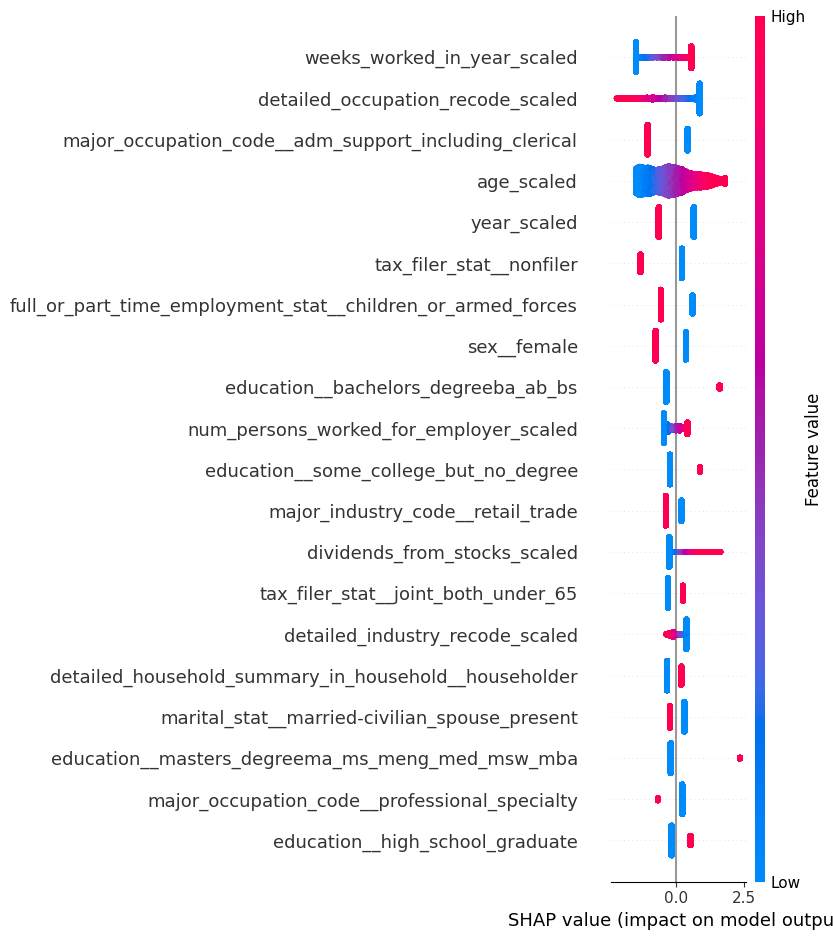

In [73]:
shap.summary_plot(shap_values, X_test_final)

shap.force_plot(explainer.expected_value, shap_values.values[0], X_test_final.iloc[0])